# Dog Breed Classification Project - Predicting dog breeds

This project uses the Tensorflow framework to identify the breed of a dog, given an image of a dog.  

This project is a multi-class image classification (unstructured data). TensorFlow mobilenet_v2_130_224 was used to build and train a Neural Network that will classify a dog's breed from images passed as input.

Below is a subset of the end results for the patterns found given the machine learning model.

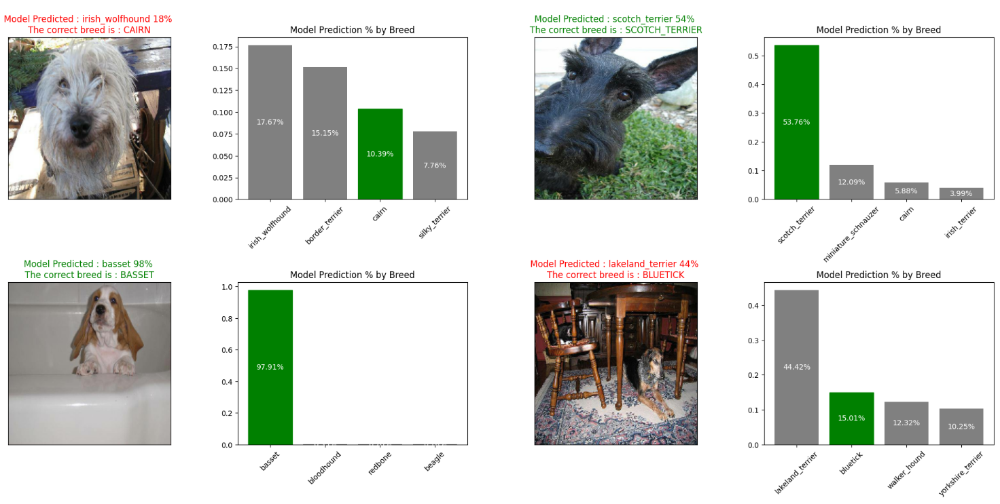

#### The visualized workflow of the overall process.  

#### High level steps taken:
- Get the data ready and do EDA(Exploratory data Analysis)
- Turn the data into Tensors (TensorFlow framework) and create batches
- Create, Train and Evaluate the model (Keras API)
- Visualize and share the findings
- Options to improve results



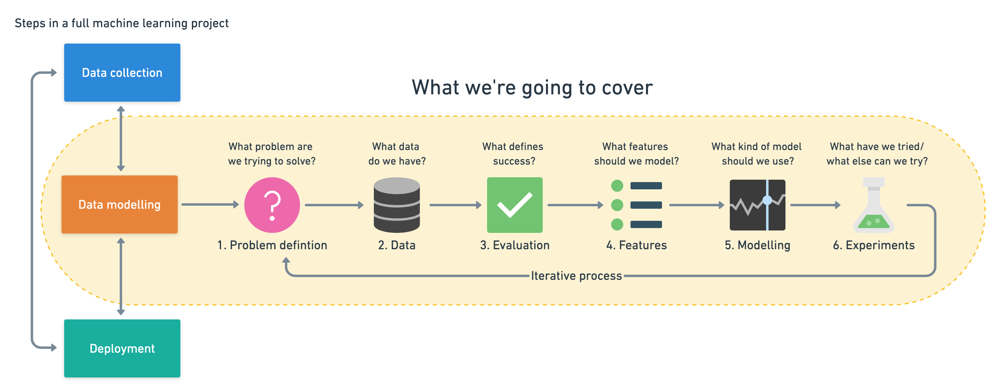

#### Iterative process for Machine Learning Framework

#### 1. Problem

Identify the breed of a dog given an image of a dog.  Based on the image of 120+ different dog breeds. Correctly identify the dog's breed.

#### 2. Data

The data is from Kaggle's dog breed identification competition. https://www.kaggle.com/c/dog-breed-identification/data

#### 3. Evaluation

Evaluated on Multi Class Log Loss between the predicted probability and the observed target. Prediction probabilities for each dog breed on each test image. https://www.kaggle.com/c/dog-breed-identification/overview

#### 4. Features

Information about the data:

Unstructured data (dog images) containing training (10K+) and test (10k+) sets having a filename that is its unique id.
The data does not have labels as we need to predict these using deep learning/ transfer learning.
120 different (classes) breeds of dogs are listed under 'data description' at this link https://www.kaggle.com/c/dog-breed-identification/data

#### 5. Modeling: Tools usedling: Tools used

In [ ]:
# (EDA) Exploring Data Analysis and plotting libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread

# Platform, Models and workflow
import tensorflow as tf
import tensorflow_hub as hub
import tf_keras as tfk
# Model Evaluations
from sklearn.model_selection import train_test_split

# utility modules
import os
import datetime
import random
from sklearn.preprocessing import OneHotEncoder
from IPython.display import Image

import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub vesrion: ", hub.__version__)
# Check for GPU availability
print("GPU", "available - Yes" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version:  2.17.0
TF Hub vesrion:  0.16.1
GPU not available :(


In [ ]:
# Label data has 10K+ in the file with 120 unique breeds

labels_csv = pd.read_csv("drive/MyDrive/dog_vision/dog-breed-identification/labels.csv")
print(labels_csv.describe())
labels_csv.head(1)

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull


## EDA (Exploratory Data Analysis)

#### Convert all image Filepaths to a list [of, strings]


 - Working with filepaths (strings) is much efficient than working with images

In [ ]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/dog_vision/dog-breed-identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10 filenames
filenames[:1]

['drive/MyDrive/dog_vision/dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg']

#### Turn data labels into numbers

##### Turn data into an array of string

In [ ]:
labels = labels_csv["breed"].to_numpy() # -or- labels = .np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

##### Find unique label values

In [ ]:
unique_breeds = np.unique(labels)
print(f"Of the {len(labels)} rows of data in labels_csv")
print("There total amount of unique breeds are: ", len(unique_breeds))

Of the 10222 rows of data in labels_csv
There total amount of unique breeds are:  120


##### Turn every label into a boolean array

In [ ]:
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[2]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

## Prepare the data

#### Data : Put data into Test/Train/Validation sets

In [ ]:
# X is the data, .jpg path to the file
X = filenames

# y is the label (what we are solving for)
y = boolean_labels

# Running 10k images will take forever so, we can use 1k sample
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

# Split data into training and validation sets using NUM_IMAGES
# Notice we are slicing at 1k vs. using the whole 10k
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

# Train X and y length should match ... val X and y lengths should match
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

#### Preprocessing images to Tensors

##### Function: img-file-path to a Tensor

In [ ]:
# Define image size
IMG_SIZE = 224
def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
1.   Takes an image filename as input.  Uses TensorFlow to read the file and save it to a variable, image.
2.   Turn the image (a jpeg file) into Tensors.
3.   Normalize the image:  Use TF to convert RGB[0-255] to a scaled [0-1] value
4.   Resize the image to be of shape (224, 224).
     Return the modified image.
  """
  # Read in image file
  # Reads it in as a <tf.Tensor dtype= string ... shape of super long string
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-225 values to 0-1 values
  # Convert_image... to a dtype of, tensor flow, -> scales it range from [0-1] instead of [0-255]
  # Normalization: computing is way easier and now in a TF (compatible)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

#### Data: Creating data batches

##### What's a batch?

A batch (also called mini-batch) is a small portion of your data, say 32 (32 is generally the default batch size) images and their labels. In deep learning, instead of finding patterns in an entire dataset at the same time, you often find them one batch at a time.

I.E. 10,000+ images may take up more memory than your GPU has so, computing on them all would result in an error.

Instead, it's more efficient to create smaller batches of your data and compute on one batch at a time.

- search 'yann lecum or jeremy howard + batch size' they are founders of the convolutional neural nertworks.  Use Twitter or other media to research, "Friend don't let friends use minibatches larger than 32"

#### Function: Return a tuple (image-as-Tensor, label var)

- (Tensor of pre-defined image path as Tensor, empty variable to hold label)

In [ ]:
# Turn our image file path names and their associated labels
# into tuple (image, label) which will later be turned into Tensors
def get_image_label(image_path, label):
  """
  Takes an image file path and the associated label,
  processes the image and returns a tuple of (image, label).
  For later process of mapping Valdation and Training data into batches
  """
  image = process_image(image_path)
  return image, label

# See what our function does, what does this looks like
# (process_image(X[42]), y[42])
# X=filenames y=boolean_labels
# (<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
#  array([[[0.3264178 , 0.5222886 , 0.3232816 ],
#         [0.2537167 , 0.44366494, 0.24117757],
#         [0.25699762, 0.4467087 , 0.23893751],
#         ...,

#### Batches function:  Turn Test/Train/Val sets into batches

In [ ]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data (adaptible regardless of order)
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we don't have labels
  if test_data:
    print("Creating test data batches...")
    # tf.data.Dataset = make a test data set (this is from a series 'data')
    # from only filepaths (filenames = X now in the form of Tensors) no labels(y)
    # .from_tensor_slices = pass me some Tensors and I'll create a dataset from(X)
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    # X is now a Tensor
    # Turn the Tensorflow dataset into a batch size of 32
    # Now normalized Tensors can be turned into to a .batch(shape 32 across)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    # tf.data.Dataset = make a test data set (this is from 2 series 'data')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    # X and y are now Tensors
    # map based on the function thats has 2 series
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    # take the 'data' (Tensorflow data set...filepaths and data )
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping
    # image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

## Create training and validation data batches

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

Creating training data batches...
Creating validation data batches...


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Choose and fit/train a model

#### TensorFlow Hub is a resource to find pre-trained ML models

- Using a pretrained machine learning model is often referred to as `transfer learning`.  These can be found on [Kaggle Models](https://www.kaggle.com/models?query=&task=&lang=&id=&datatype=&framework=&license=&size=&fine-tunable=&minUsabilityRating=&publisher=&tfhub-redirect=true)
 -or- [TensorFlow Hub](https://www.tensorflow.org/hub)
   -or [Pytorch Hub](https://pytorch.org/docs/stable/hub.html)
     -or-[Model Zoo](https://modelzoo.co/) -or- [Papers with Code](https://paperswithcode.com/)

- We need to know:
  - The input shape (images, in the form of Tensors) to our model.
  - The output shape (image labels, in the form of Tensors) of our model.
  - The URL of the model we want to use.

We want the model to output some sort of learned patterns so that we can make predictions on more

In [ ]:
# batch_size=None : This is inferred from the data we pass the model.
# In our case, it'll be 32 since that's what we've used to set up our data
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds) # number of unique labels

# Setup model URL from TensorFlow Hub
#"https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

#### Keras is a high-level neural network library that runs on top of TensorFlow.

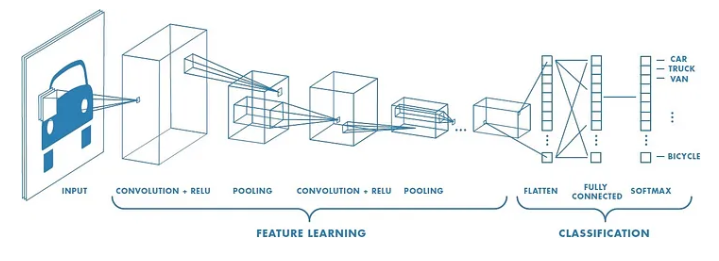

#### Create a model

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  # A Keras model that is run in sequential fashion
  # The model runs a mobilenet_v2 architecture
  # transfer learning that has been implemented for us (convolutions that find patterns for us)
  model = tf.keras.Sequential([
    # This input layer takes in our images and finds patterns in them based on the patterns mobilenet_v2_130_224 has found.
    # Tells TF hub to create a Karas layer (deep learning model) --> of our model
        #hub.KerasLayer(MODEL_URL), # --> Layer 1 (input layer...as defined in the mobile net v2 docs)
    tf.keras.layers.Lambda(lambda x: hub.KerasLayer(MODEL_URL)(x)),
    # The output layer of our model brings all of the information discovered in the input layer together and
    # outputs in our given shape (120 unique labels) vs.1x1x1280 #2 overall architecture https://towardsdatascience.com/review-mobilenetv2-light-weight-model-image-classification-8febb490e61c
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          # The activation="softmax" parameter tells the output layer, we'd like to assign
                          # a probability value to each of the 120 labels somewhere between 0 & 1.
                          # The higher the value, the more the model believes the input image should have that label.
                          # If we were working on a binary classification problem, we'd use activation="sigmoid".
                          activation="softmax") # --> Layer 2 (output layer...as defined in the mobile net v2 docs)
  ])

  # Compile the model
  # Define how the modle will learn
  model.compile(
      # search 'which loss function should I use when training deep learning models'
      # https://machinelearningmastery.com/how-to-choose-loss-functions-when-training-deep-learning-neural-networks/
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this 0=best(how well/wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      # Different or custom metrics to use:  https://machinelearningmastery.com/custom-metrics-deep-learning-keras-python/
      metrics=["accuracy"] # Evaluation of guesses after it has learned.  We'd like this to go up
  )

  # Build the model
  # layer from TensorFlow Hub tells our model what input shape it can expect
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                      │ (None, 1001)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 120)                 │         120,240 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 120,240 (469.69 KB)

 Trainable params: 120,240 (469.69 KB)

 Non-trainable params: 0 (0.00 B)

#### Create callbacks for the model (logging training progress)

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving (overfitting).

##### TensorBoard

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  # Create a new folder for logs in your project structure as the path to put logs
  logdir = os.path.join("drive/MyDrive/dog_vision/dog-breed-identification/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

##### Early Stopping Callback

Early stopping helps prevent overfitting by stopping a model when a certain evaluation metric stops improving. If, a model trains for too long, it can do so well at finding patterns in a certain dataset that it's not able to use those patterns on another dataset it hasn't seen before (doesn't generalize).


In [ ]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

#### Training a model (on a subset of 1k data)

##### Epochs

`NUM_EPOCHS` defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.

If `NUM_EPOCHS=1`, the model will **only look at the data once** and will probably score badly because it **hasn't a chance to correct itself**. It would be like you competing in the international hill descent championships and your friend **Adam only being able to give you 1 possible set of instruction** to get down the hill.  More options = more learned patterns (to predict outcomes)

**Each EPOCH is a newly trained model**.  Every EPOCH thereafter is using what was learned from the previous trainig run.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every EPOCH
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2
Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 156s 5s/step - accuracy: 0.0395 - loss: 5.0539 - val_accuracy: 0.2350 - val_loss: 3.4980
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 71s 3s/step - accuracy: 0.6071 - loss: 1.9833 - val_accuracy: 0.4950 - val_loss: 2.2037
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 73s 3s/step - accuracy: 0.9225 - loss: 0.6586 - val_accuracy: 0.5950 - val_loss: 1.7049
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.9826 - loss: 0.2733 - val_accuracy: 0.6150 - val_loss: 1.5191
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 87s 3s/step - accuracy: 0.9988 - loss: 0.1486 - val_accuracy: 0.6350 - val_loss: 1.4354
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 85s 3s/step - accuracy: 0.9996 - loss: 0.1011 - val_accuracy: 0.6500 - val_loss: 1.3824
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 70s 3s/step - accuracy: 1.0000 - loss: 0.0735 - val_accuracy: 0.6500 - val_loss: 1.3584
Ep

In [ ]:
%tensorboard --logdir drive/MyDrive/dog_vision/dog-breed-identification/logs

Launching TensorBoard...

<IPython.core.display.Javascript object>

### Making and evaluating predictions using a trained model

Making predictions with a trained model is as calling `predict()` on it and passing it data in the same format the model was trained on.

Making predictions with our model returns an array with a different value for each label.

In this case, making predictions on the validation data (200 images) returns an array (predictions) of arrays, each containing 120 different values (one for each unique dog breed).

These different values are the probabilities or the likelihood the model has predicted a certain image being a certain breed of dog. The higher the value, the more likely the model thinks a given image is a specific breed of dog.

Let's see how we'd convert an array of probabilities into an actual label.

In [ ]:
# Make predictions on the validation data (not used to train on)
# verbose shows us how long there is to go
predictions = model.predict(val_data, verbose=1)
predictions

# predictions[0] a probability value for each of the 120 labels
# len(predictions[0]) = 120
# predictions.shape = (200,120)
# len(y_val) = 200

7/7 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step


array([[1.7607906e-03, 3.7421082e-04, 2.3039491e-03, ..., 1.4990410e-04,
        5.0306821e-04, 1.0194373e-02],
       [8.1530429e-04, 2.7460996e-03, 2.8869151e-03, ..., 5.3307661e-03,
        3.1811474e-03, 3.2842258e-04],
       [3.9472798e-06, 9.0256348e-05, 1.1280425e-05, ..., 8.1243106e-06,
        1.6780794e-05, 1.2338556e-04],
       ...,
       [5.1879338e-06, 8.3147970e-05, 3.7461934e-05, ..., 5.0283063e-05,
        1.4456801e-04, 2.2358313e-04],
       [6.6999346e-03, 6.4983033e-04, 4.3771468e-04, ..., 4.3552218e-04,
        9.2135306e-05, 2.4712432e-02],
       [7.5920345e-04, 4.5566740e-06, 1.2902459e-03, ..., 5.7344348e-03,
        8.9144893e-04, 3.0702603e-04]], dtype=float32)

#### Fuction:  Compare a prediction to its true label and original image

Note: Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities (confidence interval)
pred_label = get_pred_label(predictions[0])
pred_label

Now we've got a list of all different predictions our model has made, we'll do the same for the validation images and validation labels.

Remember, the model hasn't trained on the validation data, during the fit() function, it only used the validation data to evaluate itself. So we can use the validation images to visually compare our models predictions with the validation labels.

Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

In [ ]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("\nModel Predicted : {} {:2.0f}% \nThe correct breed is : {}".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label.upper()),
                                      color=color)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  # .argsort() returns sorted index values from actual values --> low-high
  # Once sorted the last 10 indexes will have the highest probability values
  # [-10:] last 10 values (begin at 10th from end: go till end)
  # [::-1] reverse the order (no begin:no end: from the end step by -1)
  top_10_pred_indexes = pred_prob.argsort()[-4:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation=45)

  # Add percentage values above the bars
  for i, v in enumerate(top_10_pred_values):
        plt.text(i, v / 2, f"{v*100:.2f}%", ha='center', va='center', color='white')

  # Add title
  plt.title("Model Prediction % by Breed")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

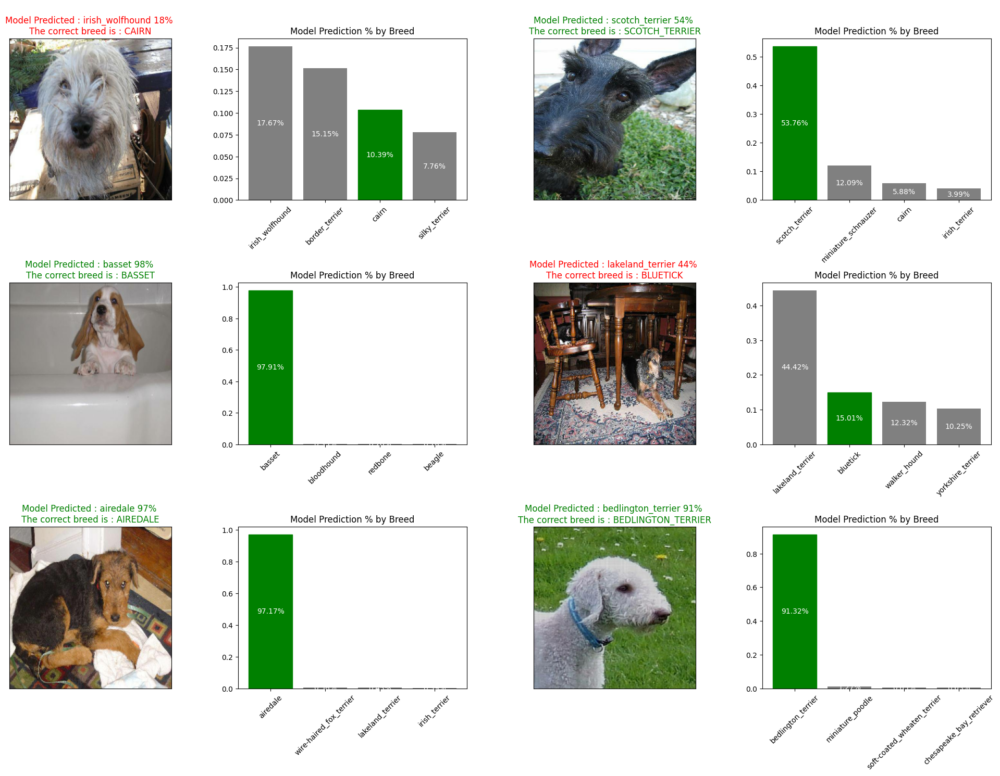

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 0 #@param {type:"slider", min:0, max:10000, step:10}
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving a model

In [ ]:
def save_model(model, fileName=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/MyDrive/dog_vision/dog-breed-identification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + fileName + ".keras" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Save our model trained on 1000 images
save_model(model, fileName="1000-images-mobilenetV2-Adam")

Saving model to: drive/MyDrive/dog_vision/dog-breed-identification/models/20240821-01321724203936-1000-images-mobilenetV2-Adam.keras...


'drive/MyDrive/dog_vision/dog-breed-identification/models/20240821-01321724203936-1000-images-mobilenetV2-Adam.keras'

### Loading Model

In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Load our model trained on 1000 images
# model_1000_images = load_model('drive/MyDrive/dog_vision/dog-breed-identification/models-1000-images-mobilenetV2-Adam.keras')

## How to improve model accuracy :

1. Trying different models - A different model could perform better on our dataset.
  - There are may models that can be used on a classification project from the following sources.  These can be found on [Kaggle Models](https://www.kaggle.com/models?query=&task=&lang=&id=&datatype=&framework=&license=&size=&fine-tunable=&minUsabilityRating=&publisher=&tfhub-redirect=true)
 or [TensorFlow Hub](https://www.tensorflow.org/hub)
   or [Pytorch Hub](https://pytorch.org/docs/stable/hub.html)
     or [Model Zoo](https://modelzoo.co/) or [Papers with Code](https://paperswithcode.com/)
2. Data augmentation - We used 1k of the 10k images available.  
- More data to train would yield a better result.  
However, it would require more processing time for the GPU/CPU.  
- More custom images could be added ad-hoc.

3. Manipulation of existing images (crop, resize) or, distort them (flip, rotate) to create more training (increased training/test data).

4. [Fine-tuning](https://www.tensorflow.org/hub/tf2_saved_model#fine-tuning)